In [88]:
%matplotlib notebook

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
import os, math
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.vector_ar.vecm import coint_johansen
import seaborn as sns
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic
from statsmodels.stats.stattools import durbin_watson
from pandas.plotting import table
import statsmodels.api as sm
np.random.seed(0)
import scipy.stats as st
import scipy.stats as st

%matplotlib inline

# UTILITY OBJECTS

In [89]:
dates_processor = lambda x: "{}-01-{}".format(int(x.split("-")[1][1])*3, x.split("-")[0])
new_dates_processor = lambda x: "{}-01-{}".format(int(x[-1])*3, x[:4])

subsample_countries = ["KOR","GBR","ESP","JPN","CAN","USA","MEX","DEU","ITA","CHE","SWE","FRA"]
country_code_map = { 'Austria':"AUT", 'Belgium':"BEL", 'Finland':"FIN", 'France':"FRA", 'Germany':"DEU", 'Greece':"GRC", 'Ireland':"IRL", 'Italy':"ITA", 'Luxembourg':"LUX", 'Netherlands, The':"NLD","Netherlands":"NLD", 'Portugal':"PRT", 'Spain':"ESP", 'Australia':"AUS", 'Canada':"CAN", 'Denmark':"DNK", 'Iceland':"ISL", 'Japan':"JPN", 'Korea, Rep. of' :"KOR",'Korea' :"KOR", 'Norway':"NOR", 'Switzerland':"CHE", 'United Kingdom':"GBR","UK":"GBR", 'United States':"USA","US":"USA", 'Mexico':"MEX", "Sweden":"SWE"}

In [90]:
def network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 2, num_home_nfci_lags = 2, num_foreign_nfci_lags = 2):
    statistics = {"AIC": pd.DataFrame(columns = network.columns, index = network.columns)}
    for i, home in enumerate(network.columns):
        partners = network.loc[home]
        statistic = {'pvalue':pd.DataFrame(), 'beta': pd.DataFrame(), 'upper_conf' :pd.DataFrame(), 'lower_conf':pd.DataFrame()}

        for partner in partners:
            if home != partner:
                data = pd.DataFrame()
                
                data['u_sc'] = network.loc[home][partner]
                
                
                data['log_trade_ratio'] = np.log(exports_data[home][partner]/imports_data[home][partner])
                for lag in range(1,num_export_lags+1):
                    data['u_Ln_TR_L{}'.format(lag)] = data['log_trade_ratio'].shift(lag)
                
                
                minn_nfci = abs(nfci.min().min()) + 1
                
                data['nfcih'] = (nfci[home])
                for lag in range(1,num_home_nfci_lags+1):
                    data['u_hnfci_L{}'.format(lag)] = data['nfcih'].shift(lag) 
                    
                data['nfcif'] = (nfci[partner])
                for lag in range(1,num_foreign_nfci_lags+1):
                    data['u_fnfci_L{}'.format(lag)] = data['nfcif'].shift(lag)
                
                data.dropna(inplace = True)
                data = data[[c for c in data.columns if 'u_' in c]]
                
                Y = data['u_sc']
                X = data.drop(['u_sc'], axis=1)
                
                X = sm.add_constant(X)
                model = sm.OLS(Y,X).fit(cov="HAC")
                
                pandas_result = pd.read_html(model.summary().tables[1].as_html(), header=0, index_col=0)[0]
                statistic['pvalue'][partner] = pandas_result["P>|t|"]
                statistic['beta'][partner] = pandas_result["coef"]
                statistic['upper_conf'][partner] = pandas_result["0.975]"]
                statistic['lower_conf'][partner] = pandas_result["[0.025"]
                statistics['AIC'].loc[home,partner] = model.aic
        statistics[home] = statistic
    return statistics

In [91]:
def plot_result(results, name):
    fig = plt.figure(figsize = (25, 80))
    fig.suptitle(name, fontsize = 30, y = 1)
    for i, home in enumerate(results.keys()):
        if home != 'AIC':
            ax1 = plt.subplot2grid((12, 12), (i, 0), colspan=8, rowspan=1)
            ax2 = plt.subplot2grid((12, 12), (i, 8),colspan=4, rowspan=1)

            for stat in results[home].keys(): 
                results[home][stat]  = results[home][stat][results[home][stat].index != 'const']
                if "_" in results[home][stat].index[0]:
                    results[home][stat].index = [" ".join([v.upper() for v in f.split("_")[1:]]) for f in results[home][stat].index]
                    
            
            results[home]['beta'].T.plot.bar(ax=ax1, yerr =  (results[home]['upper_conf'].T - results[home]['beta'].T), width = 0.75, edgecolor = 'black',capsize=4)
            sns.heatmap(results[home]['pvalue'].round(2),center=0, cmap = sns.color_palette("coolwarm", 7),annot = True,  ax = ax2)
                
            ax1.set_title("Regression Coefficients and Confidence Intervals: {}".format(home), fontsize = 20)
            ax1.set_ylabel('Coefficient', fontsize = 13)
            ax2.set_title("P-Values: {}".format(home), fontsize = 20)
            
            ax1.legend(bbox_to_anchor=(1, 1), loc='upper right', borderaxespad=0.08)
            ax2.set_yticklabels(ax2.get_yticklabels(),rotation=30)
            
    plt.tight_layout(pad=3.0)
    plt.savefig('decomposition_results/SPEC_{}.png'.format(name))

# LOAD TRADE DATA

In [92]:
trade_folder = '../data/trade/'
exports_data = {}
imports_data = {}

for country in os.listdir(trade_folder):
    f = pd.read_excel(trade_folder + country, sheet_name = "Exports").rename({"Unnamed: 0":"country"}, axis=1)
    f["country"] = f["country"].map(country_code_map)
    f = f.loc[f.country.isin(country_code_map.values())]
    f = f.set_index("country")
    f = f.T
    f.index = pd.to_datetime([new_dates_processor(d) for d in f.index.values])
    f = f.applymap(lambda x: str(x).replace("r","").replace('e',"").replace(',',"")).astype(float).dropna()
    exports_data[country_code_map[country.split(".")[0]]] = f
    
for country in os.listdir(trade_folder):
    f = pd.read_excel(trade_folder + country, sheet_name = "Imports").rename({"Unnamed: 0":"country"}, axis=1)
    f["country"] = f["country"].map(country_code_map)
    f = f.loc[f.country.isin(country_code_map.values())]
    f = f.set_index("country")
    f = f.T
    f.index = pd.to_datetime([new_dates_processor(d) for d in f.index.values])
    f = f.applymap(lambda x: str(x).replace("r","").replace('e',"").replace(',',"")).astype(float).dropna()
    imports_data[country_code_map[country.split(".")[0]]] = f

# LOAD NFCI & GDP DATA

In [93]:
gdp = pd.read_csv("../data/core/oecd_qrgdp.csv")

gdp = gdp.pivot(index='TIME', columns='LOCATION', values='Value')
gdp.index  = pd.to_datetime(gdp.index.map(dates_processor))
gdp = gdp[subsample_countries]

gdp.dropna(inplace = True)

In [94]:
nfci = pd.read_csv("../data/core/nfci.csv")

nfci["Dates"]  = pd.to_datetime(nfci["Dates"].apply(dates_processor))
nfci.set_index(nfci["Dates"], inplace = True)
nfci = nfci[subsample_countries]

nfci.dropna(inplace = True)

# DECOMPOSE NETWORK

#### FOR 5th Quantile Network

In [95]:
network = pd.read_csv("../data/networks/Q5F1O1.csv", parse_dates = ["date"]).set_index(['country','date'])

In [96]:
specifications = {}
specifications['L101'] = network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 1, num_home_nfci_lags = 0, num_foreign_nfci_lags = 1)
specifications['L110'] = network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 1, num_home_nfci_lags = 1, num_foreign_nfci_lags = 0)
specifications['L111'] = network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 1, num_home_nfci_lags = 1, num_foreign_nfci_lags = 1)
specifications['L112'] = network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 1, num_home_nfci_lags = 1, num_foreign_nfci_lags = 2)
specifications['L121'] = network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 1, num_home_nfci_lags = 2, num_foreign_nfci_lags = 1)
specifications['L122'] = network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 1, num_home_nfci_lags = 2, num_foreign_nfci_lags = 2)
specifications['L211'] = network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 2, num_home_nfci_lags = 1, num_foreign_nfci_lags = 1)
specifications['L212'] = network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 2, num_home_nfci_lags = 1, num_foreign_nfci_lags = 2)
specifications['L221'] = network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 2, num_home_nfci_lags = 2, num_foreign_nfci_lags = 1)
specifications['L222'] = network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 2, num_home_nfci_lags = 2, num_foreign_nfci_lags = 2)
specifications['L333'] = network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 3, num_home_nfci_lags = 3, num_foreign_nfci_lags = 3)
specifications['L444'] = network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 4, num_home_nfci_lags = 4, num_foreign_nfci_lags = 4)
specifications['L555'] = network_decomposer(network, exports_data, imports_data, gdp, nfci,num_export_lags = 5, num_home_nfci_lags = 5, num_foreign_nfci_lags = 5)

# AGGREGATE RESULTS FOR DIFFERENT SPECIFICATIONS

In [97]:
statistics = []
for spc in specifications.keys():
    agg_stats = pd.concat([pd.DataFrame([specifications[spc][c]["beta"].mean(axis=1) for c in subsample_countries]).mean(),
    pd.DataFrame([specifications[spc][c]["upper_conf"].mean(axis=1) for c in subsample_countries]).mean(),
    pd.DataFrame([specifications[spc][c]["lower_conf"].mean(axis=1) for c in subsample_countries]).mean(),
    pd.DataFrame([specifications[spc][c]["pvalue"].mean(axis=1) for c in subsample_countries]).mean()], axis=1)
    agg_stats.columns = ['Beta','Upper Conf','Lower Conf','PValue']
    agg_stats.index =  [x[2:].replace('_',' ').upper() for x in agg_stats.index]
    agg_stats = pd.concat([agg_stats], keys = ['Ln TR {} HNFCI {} FNFCI {} : AIC ({})'.format(spc[0],spc[1],spc[2], specifications[spc]['AIC'].sum().astype(int).sum())])
    statistics.append(agg_stats)
    
statistics  = pd.concat(statistics)

f = open("tables/{}.txt".format("Aggregate Result for Network Decomposition"),"w") 
statistics.round(4).to_latex(buf = f) 
f.close()
statistics

Beta  Upper Conf  \
Ln TR L HNFCI 5 FNFCI 5 : AIC (-74359) NST       2.021667e-02    0.025386   
                                       LN TR L1 -7.475700e-04    0.012841   
                                       LN TR L2  1.687841e-03    0.015651   
                                       LN TR L3  2.163155e-03    0.016235   
                                       LN TR L4  1.163428e-03    0.014895   
                                       LN TR L5  1.727746e-03    0.014720   
                                       HNFCI L1  2.185253e-04    0.002295   
                                       HNFCI L2 -2.260897e-05    0.002637   
                                       HNFCI L3  1.014373e-04    0.002796   
                                       HNFCI L4 -7.784781e-05    0.002538   
                                       HNFCI L5  3.402095e-04    0.002381   
                                       FNFCI L1 -2.026818e-06    0.001995   
                                       FNFCI L2 -1.047184e-05    0.002598   
                                       FNFCI L3  4.290821e-05    0.002629   
                                       FNFCI L4  1.993902e-05    0.002652   
                                       FNFCI L5 -1.523995e-04    0.001812   
Ln TR L HNFCI 2 FNFCI 2 : AIC (-76537) NST       2.072955e-02    0.024856   
                                       LN TR L1  1.680303e-03    0.013727   
                                       LN TR L2  2.447990e-03    0.014387   
                                       HNFCI L1  3.872834e-05    0.001608   
                                       HNFCI L2  2.541055e-04    0.001246   
                                       FNFCI L1 -2.829985e-06    0.001204   
Ln TR L HNFCI 2 FNFCI 2 : AIC (-76628) NST       2.069545e-02    0.024902   
                                       LN TR L1  1.965157e-03    0.014068   
                                       LN TR L2  2.315372e-03    0.014168   
                                       HNFCI L1  4.678134e-05    0.002106   
                                       HNFCI L2  2.499493e-04    0.002260   
                                       FNFCI L1  2.394963e-05    0.002002   
                                       FNFCI L2 -2.351823e-05    0.001971   
Ln TR L HNFCI 4 FNFCI 4 : AIC (-75138) NST       2.026591e-02    0.025106   
...                                                       ...         ...   
Ln TR L HNFCI 1 FNFCI 2 : AIC (-77358) NST       2.077576e-02    0.024561   
                                       LN TR L1  3.554786e-03    0.012568   
                                       HNFCI L1  1.952306e-05    0.001615   
                                       HNFCI L2  2.580162e-04    0.001266   
                                       FNFCI L1 -6.417174e-06    0.001249   
Ln TR L HNFCI 3 FNFCI 3 : AIC (-75841) NST       2.044786e-02    0.024977   
                                       LN TR L1  1.751515e-03    0.014371   
                                       LN TR L2  1.573232e-03    0.014962   
                                       LN TR L3  1.948723e-03    0.014265   
                                       HNFCI L1  1.279047e-04    0.002197   
                                       HNFCI L2 -6.474455e-06    0.002653   
                                       HNFCI L3  2.304397e-04    0.002287   
                                       FNFCI L1  2.624583e-05    0.002002   
                                       FNFCI L2 -4.354897e-06    0.002614   
                                       FNFCI L3 -1.614115e-05    0.002015   
Ln TR L HNFCI 1 FNFCI 0 : AIC (-75517) NST       2.107555e-02    0.024955   
                                       LN TR L1  3.604081e-03    0.012562   
                                       FNFCI L1  1.164674e-04    0.000713   
Ln TR L HNFCI 1 FNFCI 1 : AIC (-77349) NST       2.076515e-02    0.024614   
                                       LN TR L1  3.879545e-03    0.012992   
                                       HNFCI L1  2.10

# DETAILED RESULTS FOR DIFFERENT SPECIFICATIONS

In [98]:
def plot_result(results, name):
    fig = plt.figure(figsize = (25, 80))
    fig.suptitle(name, fontsize = 30, y = 1.01)
    for i, home in enumerate(results.keys()):
        if home != 'AIC':
            ax11 = plt.subplot2grid((12, 12), (i, 0), colspan=4, rowspan=1)
            ax12 = plt.subplot2grid((12, 12), (i, 4), colspan=4, rowspan=1)
            ax2 = plt.subplot2grid((12, 12), (i, 8),colspan=4, rowspan=1)

            for stat in results[home].keys(): 
                results[home][stat]  = results[home][stat][results[home][stat].index != 'const']
                if "_" in results[home][stat].index[0]:
                    results[home][stat].index = [" ".join([v.upper() for v in f.split("_")[1:]]) for f in results[home][stat].index]
                    
            errors = (results[home]['upper_conf'].T - results[home]['beta'].T)
            trade = [i for i in results[home]['beta'].index if 'TR' in i]
            nfci = [i for i in results[home]['beta'].index if 'NFCI' in i]
            

            results[home]['beta'].T[trade].plot.bar(ax=ax11, yerr = errors[trade]  , width = 0.75, edgecolor = 'black',capsize=4)
            results[home]['beta'].T[nfci].plot.bar(ax=ax12, yerr = errors[nfci]  , width = 0.75, edgecolor = 'black',capsize=4)
            sns.heatmap(results[home]['pvalue'].round(2),center=0, cmap = sns.color_palette("coolwarm", 7),annot = True,  ax = ax2)
                
            ax12.set_title("Regression Coefficients and Confidence Intervals: {}".format(home), fontsize = 20)
            ax11.set_ylabel('Coefficient', fontsize = 22)
            ax11.legend(bbox_to_anchor=(1, 1), loc='upper right', borderaxespad=0.1)
            
            ax2.set_title("P-Values: {}".format(home), fontsize = 20)
            ax2.set_yticklabels(ax2.get_yticklabels(),rotation=30)
    
    fig.subplots_adjust(wspace=0.001,hspace=0.001)
    plt.tight_layout(pad=3)
    plt.savefig('decomposition_results/SPEC_{}.png'.format(name))

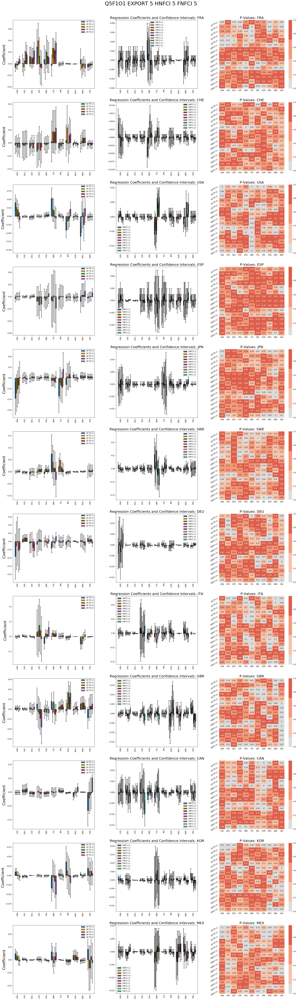

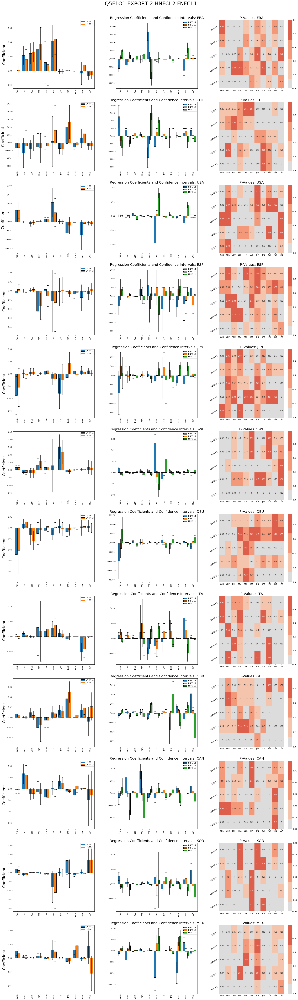

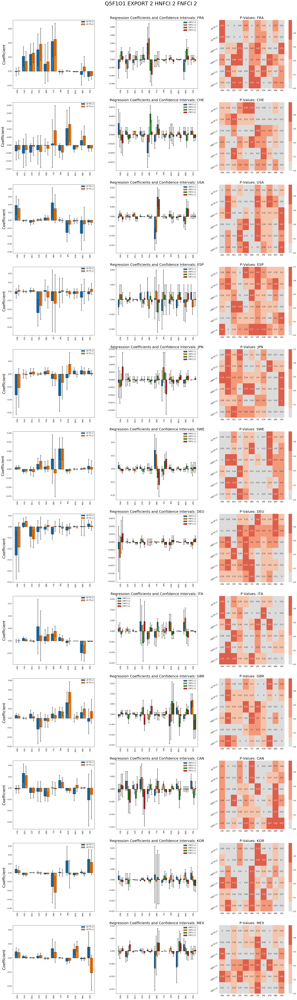

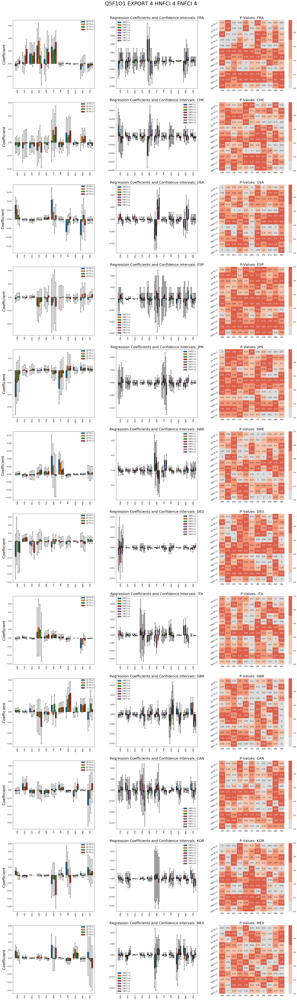

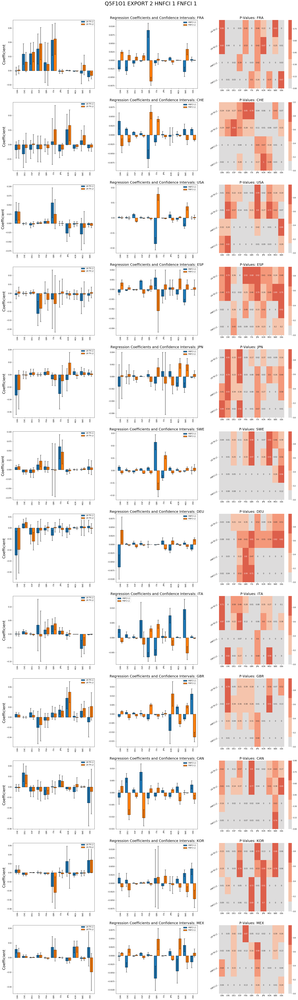

...

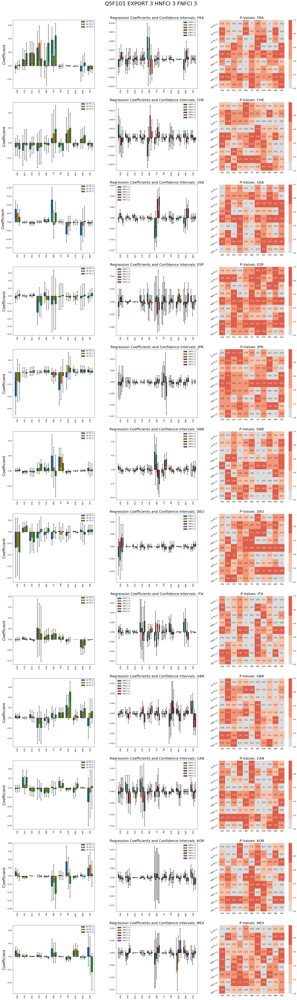

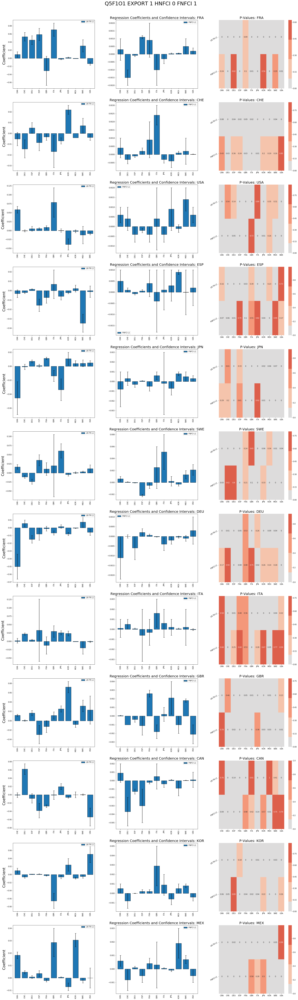

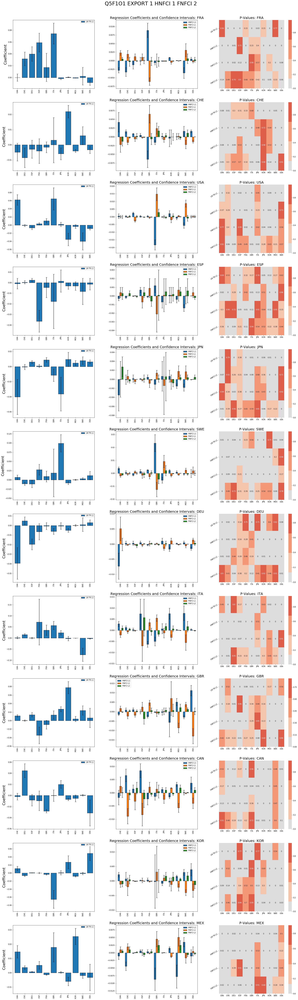

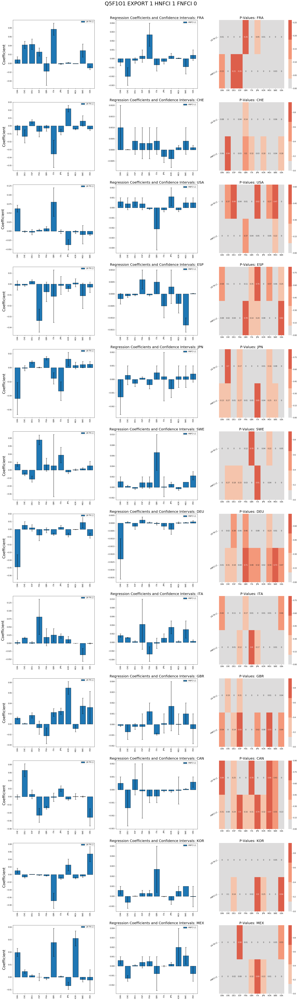

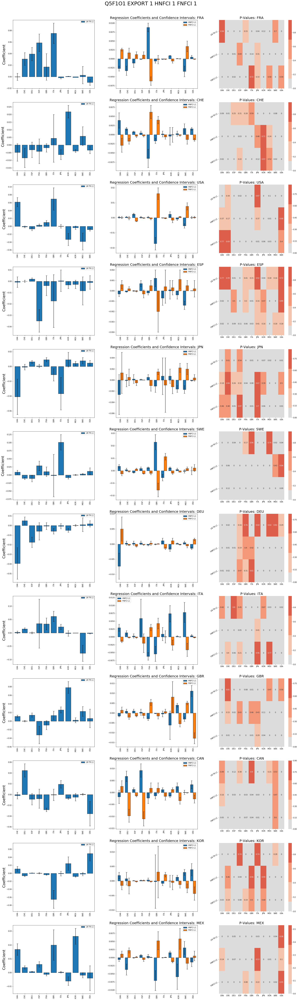

In [99]:
for specification in specifications.keys():
    plot_result(specifications[specification], "Q5F1O1 EXPORT {} HNFCI {} FNFCI {}".format(specification[1],specification[2],specification[3]))
    